<a href="https://colab.research.google.com/github/MariiaS/moml/blob/main/V4_spectral_clustering_%2B_Kmeans_via_elbow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***1/ Initialisation data reduced***

***We will use for our clustering the Shi & Malik method with multiple eigenvectors. Recurrent bi-partitioning being inefficient insofar as it is difficult to obtain a very separated graph between the two smallest eigenvectors. This is due to the fact that we have noisy datas.***

To avoid problems launch with colab 

## ***Create a 2D small dataset***

In [ ]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import random as rnd
import networkx as nx
import scipy as sy
import sklearn as sk
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
 
# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from scipy.sparse.linalg import eigsh
from sklearn.neighbors import NearestNeighbors
#K-means
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
!wget -O dataset.csv https://www.openml.org/data/get_csv/49817/wine_quality.arff

--2020-11-30 12:32:51--  https://www.openml.org/data/get_csv/49817/wine_quality.arff
Resolving www.openml.org (www.openml.org)... 131.155.11.11
Connecting to www.openml.org (www.openml.org)|131.155.11.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/plain]
Saving to: ‘dataset.csv’

dataset.csv             [   <=>              ] 340.28K   626KB/s    in 0.5s    

2020-11-30 12:32:53 (626 KB/s) - ‘dataset.csv’ saved [348451]



 ***1) This example is there, to make clustering more visual. We have therefore chosen two features for a 2D representation.We made a clustering with all features on an other notebook.***

In [ ]:
datas = pd.read_csv('dataset.csv')

In [ ]:
datas_reduced = datas[0:200]
datas_reduced

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
195,7.8,0.590,0.33,2.0,0.074,24.0,120.0,0.9968,3.25,0.54,9.4,5
196,7.3,0.580,0.30,2.4,0.074,15.0,55.0,0.9968,3.46,0.59,10.2,5
197,11.5,0.300,0.60,2.0,0.067,12.0,27.0,0.9981,3.11,0.97,10.1,6
198,5.4,0.835,0.08,1.2,0.046,13.0,93.0,0.9924,3.57,0.85,13.0,7


***2) We chose the first two colones***

In [ ]:
np_datas = datas_reduced.to_numpy()
np_datas_2D = np_datas[:,0:2]
# np_datas_2D

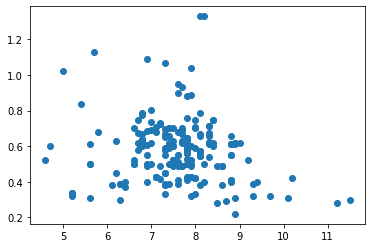

In [ ]:
plt.scatter(np_datas_2D[:,0],np_datas_2D[:,1])

## ***Doing the first matrice with euclidian distances***

### ***function for euclidian***

***1) We do the adjacency matrix with the euclidian norm***

In [ ]:
def euclidian_distance(line1,line2):
  #here we do the squared of the difference between two lines
  line = (line1-line2)*np.transpose((line1-line2))
  #We do the sum on the line to obtain the euclidian norm
  nombre = sum(line)
  return np.sqrt(nombre);

### ***adjacency matrix***

***The following code is there to create the adjacency matrix.
We start by making a full square matrix of 0 with the dimension of the dataset.***

***After that we browse along the matrix to calculate the euclidian norm. we use a double "for" loop. We calculate the distance for the upper part of the matrix because it is symmetrical. And we just copy past the transpose to have the all matrix.***

In [ ]:
A = np.zeros((len(np_datas_2D),len(np_datas_2D)))
for i in range(len(np_datas_2D)):
  for j in range(len(np_datas_2D)):
    if j > i :
      A[i][j]=euclidian_distance(np_datas_2D[i],np_datas_2D[j])
# print(A)
A = A + np.transpose(A)
print(A)      
A.mean()

[[0.         0.43863424 0.40447497 ... 4.11946598 2.00455107 0.63411355]
 [0.43863424 0.         0.12       ... 3.74518357 2.40042184 0.92417531]
 [0.40447497 0.12       0.         ... 3.72848495 2.40117159 0.95859272]
 ...
 [4.11946598 3.74518357 3.72848495 ... 0.         6.12341612 4.667344  ]
 [2.00455107 2.40042184 2.40117159 ... 6.12341612 0.         1.52152062]
 [0.63411355 0.92417531 0.95859272 ... 4.667344   1.52152062 0.        ]]


1.1273453454203946

## ***Epsilon graph***

### ***function for the weights***

***We transform the contiguity matrix to have an epsilon graph. We thus build here our matrix W (named A because we re-use the matrix of contiguity). For sigma, we chose 0.1 because I wanted to have a distinct demarcation between the points. A small sigma means that the values will be more spaced out on the epsilon graph. To find our epsilon we did several tests to see what gave a nice clustering. This is a delicate step because it greatly influences the number of clusters and the quality of the clustering. We chose it arbitrarily because we had no real method in the course to determine it. We have therefore taken the average of the values of the adjacency matrix divided by 3.***

Note: Sigma and epsilon are arbitrary variables. Sigma is the standard deviation of the Gaussian distribution (represents distance between points)
Epsilon was chosen through experiments and visual representation of eigengraph. Epsilon affect the number and quality of clusters a lot, so we will be back to the topic of choosing clusters on the eigengap part.

In [ ]:
#sigma defines the gap between the points on the graph
sigma = 0.1
meanA = A.mean()
epsilon = meanA/3
for i in range(len(np_datas_2D)):
  for j in range(len(np_datas_2D)):
    if A[i][j] < (epsilon):
      n = A[i][j]
      A[i][j] = np.exp(-n**2/(2*sigma))
    else : 
      A[i][j] = 0 
print(A)

[[1.        0.        0.        ... 0.        0.        0.       ]
 [0.        1.        0.9305309 ... 0.        0.        0.       ]
 [0.        0.9305309 1.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 1.        0.        0.       ]
 [0.        0.        0.        ... 0.        1.        0.       ]
 [0.        0.        0.        ... 0.        0.        1.       ]]


### ***Graph***

***We have drawn the epsilon graph. We can already see groups of points appear which can help us to select the number k of clusters. We can deduce that our epsilon is perhaps a little bit too small because our graph is already partially cut. The next step is to cut the graph with the shi and malik method and to carry out an "egeingap" to know the number of cluster.***

EdgeDataView([(0, 0, {'weight': 1.0}), (0, 4, {'weight': 1.0}), (0, 5, {'weight': 0.9920319148370607}), (0, 7, {'weight': 0.9394130628134754}), (0, 9, {'weight': 0.7788007830714052}), (0, 11, {'weight': 0.7788007830714052}), (0, 18, {'weight': 0.9412937690184057}), (0, 21, {'weight': 0.5063637471859784}), (0, 26, {'weight': 0.5376755326077269}), (0, 28, {'weight': 0.6373094172361978}), (0, 39, {'weight': 0.6959343136786418}), (0, 40, {'weight': 0.6959343136786418}), (0, 42, {'weight': 0.7629978999962201}), (0, 54, {'weight': 0.6835195639761816}), (0, 55, {'weight': 0.6175470617646803}), (0, 57, {'weight': 0.9282074740589837}), (0, 59, {'weight': 0.588310740756876}), (0, 61, {'weight': 0.6373094172361995}), (0, 62, {'weight': 0.8089646975665002}), (0, 64, {'weight': 0.8161762130223396}), (0, 65, {'weight': 0.8161762130223396}), (0, 66, {'weight': 0.8089646975665002}), (0, 70, {'weight': 0.6221960767418426}), (0, 71, {'weight': 0.6347652712514179}), (0, 72, {'weight': 0.6373094172361995}

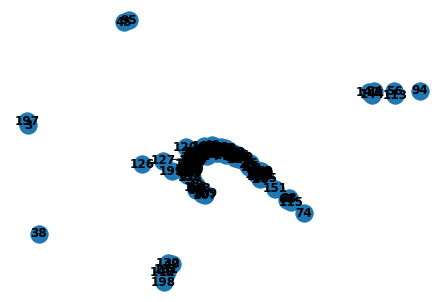

In [ ]:
G = nx.from_numpy_matrix(A)
nx.draw(G,with_labels=True,
        font_weight='bold',
       )
G.edges(data=True) 

# ***2/ Calculs on laplacian***

## ***Calcul of the normalized laplacian method from networkx***

***We compute here the normalized laplacian. We use networkx library. We have to work with networkx graph format and not numpy array. It is possible to code the normalized laplacian with numpy but this is not optimized.***

> the code is :
`Ls = np.dot(np.dot(np.sqrt(np.linalg.inv(D)),L),np.sqrt(np.linalg.inv(D)))`

***Is it possible to use others normalisation for exemple the Random walk normalized Laplacian : Lnorm = D^-1.L***


In [ ]:
Ls_nx = nx.normalized_laplacian_matrix(G)
G2 = nx.Graph(Ls_nx)
Ls = nx.to_numpy_array(G2)

## **Calcul of eigenvalues and vectors**

***Here we want to determine the number of cluster k. The most stable clustering is generally given by the value k wich represent the last "small" eigenvalue***

In [ ]:
l, V = np.linalg.eig(Ls)
ind = np.argsort(l)
l = l[ind]
V = V[:,ind]

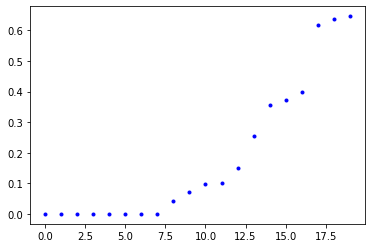

In [ ]:
plt.plot(l[0:20],'b.')

### ***number of cluster selection***

***Thanks to the graph we can see that k is 8. Now we select the first 8 eigenvectors. An eigenvector associated with an eigenvalue equal to 0 in fact represents a cluster. The 8 vectors are therefore linearly independent. If a point is not connected to the cluster, its value in the eigenvector will be 0.
By selecting the first 8 eigenvectors we therefore have information on the content of each clusters.***

In [ ]:
nb_cluster = 8
V_nb_clusters = V[:,0:nb_cluster-1]
V_nb_clusters

array([[-2.32088337e-03,  3.92867170e-03,  8.12861458e-02, ...,
         0.00000000e+00, -6.16345247e-03,  5.25841647e-03],
       [-1.89296749e-03,  3.20431776e-03,  6.62989072e-02, ...,
         0.00000000e+00, -5.02705792e-03,  4.28888911e-03],
       [-2.44087796e-03,  4.13179235e-03,  8.54888118e-02, ...,
         0.00000000e+00, -6.48211602e-03,  5.53028774e-03],
       ...,
       [ 5.71895777e-02, -1.18425312e-01,  7.57153506e-02, ...,
         0.00000000e+00, -1.24941594e-01,  7.04131078e-01],
       [-2.56162433e-01,  1.80476973e-02,  1.91774087e-03, ...,
         0.00000000e+00,  1.13410225e-01,  1.78344409e-02],
       [-6.68479848e-04,  1.13156822e-03,  2.34127019e-02, ...,
         0.00000000e+00, -1.77524809e-03,  1.51457220e-03]])

# ***3/ K-mean for spectral culstering***

## ***Training***

***Now we will do K_mean clustering on our eigenvectors data set.***


> ‘k-means++’ : selects initial cluster centers for k-mean clustering in a smart way to speed up convergence.


In [ ]:
kmeans = KMeans(init = "k-means++",n_clusters=nb_cluster)
knn_clusters = kmeans.fit_predict(np.real(V_nb_clusters))
labels = kmeans.labels_
labels

array([7, 7, 7, 2, 7, 7, 7, 7, 7, 7, 0, 7, 1, 7, 0, 0, 0, 7, 7, 7, 0, 7,
       7, 0, 0, 0, 7, 7, 7, 7, 0, 7, 0, 7, 5, 7, 7, 7, 3, 7, 7, 0, 7, 7,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 7, 7, 4, 7, 7, 7, 0, 7, 7, 7, 7, 7,
       7, 0, 0, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 0, 7, 0, 7,
       0, 7, 7, 0, 0, 7, 6, 0, 0, 7, 0, 7, 0, 7, 7, 7, 7, 7, 7, 0, 7, 7,
       7, 0, 0, 4, 7, 0, 7, 7, 0, 7, 0, 0, 7, 7, 7, 0, 0, 0, 7, 0, 7, 1,
       1, 0, 0, 0, 0, 7, 7, 7, 0, 0, 5, 0, 5, 7, 1, 7, 7, 0, 7, 0, 7, 7,
       7, 7, 7, 7, 7, 7, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 0, 0, 0, 0, 7, 7, 0, 0, 7, 7, 7, 7, 7, 0, 7, 7, 7, 7, 7, 2,
       1, 0], dtype=int32)

***We link each label to its ID in the starting dataset.***

In [ ]:
datas_reduced["k_means"] = labels
datas_reduced.head()

***We can see clusters averages values. This doesn't really give us any information in a spectral clustering, because the clusters are in the shape of a circle.***

In [ ]:
a = datas_reduced.groupby("k_means").mean()
print(a)

         fixed.acidity  volatile.acidity  ...    alcohol   quality
k_means                                   ...                     
0              7.82029          0.596159  ...   9.872464  5.202899
1              5.60000          0.573333  ...  11.350000  5.333333
2             11.35000          0.290000  ...   9.950000  6.000000
3              5.70000          1.130000  ...   9.800000  4.000000
4             10.15000          0.365000  ...   9.650000  5.500000
5              5.20000          0.333333  ...  12.400000  5.666667
6              5.00000          1.020000  ...  10.500000  4.000000
7              7.55431          0.567543  ...   9.683621  5.284483

[8 rows x 12 columns]


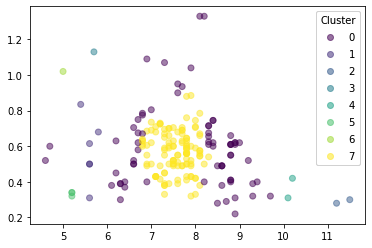

In [ ]:
fig, ax = plt.subplots()

scatter = ax.scatter(np_datas_2D[:,0], np_datas_2D[:,1], c = labels.astype(np.float),alpha = 0.5)

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster")
ax.add_artist(legend1)
plt.show()

# ***4/ Silhouette analisys***

***We are now going to do a silhouette analysis on our k_mean. Silhouette coefficient is the difference between the average distance with the points of the same group as it and the average distance with the points of the other neighboring groups. It is not really relevant in our case because our clusters have ring shapes. Which means that the coefficient will be bad for the clusters outside the center.***

In [ ]:
score = sk.metrics.silhouette_score(np.real(V_nb_clusters), kmeans.labels_, metric='euclidean')
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.593


In [ ]:
score = sk.metrics.silhouette_score(np_datas_2D, kmeans.labels_, metric='euclidean')
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.280


In [ ]:
sample_silhouette_values = sk.metrics.silhouette_samples(np_datas_2D, kmeans.labels_, metric='euclidean')
print(sample_silhouette_values)

[ 0.64912624  0.52382826  0.58441953  0.71503041  0.64912624  0.66065182
  0.5815773   0.63873679  0.64080343  0.68349063 -0.38629394  0.68349063
  0.57381522  0.63681425  0.04966395  0.04966395 -0.0990428   0.4297639
  0.67229499  0.52906277 -0.03295027  0.65069892  0.56766174 -0.0826834
 -0.4749286  -0.56373542  0.6579334   0.56766174  0.5513963   0.62868565
 -0.38139498  0.45511677 -0.24190195  0.47293603  0.96035149  0.62868565
  0.63853006  0.41031149  0.          0.63814393  0.63814393  0.08223691
  0.68168397  0.41788464 -0.429466   -0.80827199 -0.53306989  0.01827362
 -0.48569631  0.1679446   0.07657195 -0.3434533  -0.34332153 -0.02195619
  0.68255295  0.66536298  0.87158293  0.67877316  0.63991464  0.62383081
  0.07320635  0.64686455  0.68591982  0.50167525  0.58719143  0.58719143
  0.68591982 -0.33942061 -0.4569286   0.48922585  0.66353187  0.65340006
  0.64686455 -0.24014975 -0.76608053  0.07448737  0.07448737 -0.41259433
 -0.37491458 -0.24476429 -0.64313912  0.61723034  0.6

In [ ]:
for i in range(len(sample_silhouette_values)):
  if sample_silhouette_values[i] < 0:
    labels[i] = 0
labels

array([7, 7, 7, 2, 7, 7, 7, 7, 7, 7, 0, 7, 1, 7, 0, 0, 0, 7, 7, 7, 0, 7,
       7, 0, 0, 0, 7, 7, 7, 7, 0, 7, 0, 7, 5, 7, 7, 7, 3, 7, 7, 0, 7, 7,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 7, 7, 4, 7, 7, 7, 0, 7, 7, 7, 7, 7,
       7, 0, 0, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 0, 7, 0, 7,
       0, 7, 7, 0, 0, 7, 6, 0, 0, 7, 0, 7, 0, 7, 7, 7, 7, 7, 7, 0, 7, 7,
       7, 0, 0, 4, 7, 0, 7, 7, 0, 7, 0, 0, 7, 7, 7, 0, 0, 0, 7, 0, 7, 1,
       1, 0, 0, 0, 0, 7, 7, 7, 0, 0, 5, 0, 5, 7, 1, 7, 7, 0, 7, 0, 7, 7,
       7, 7, 7, 7, 7, 7, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 0, 0, 0, 0, 7, 7, 0, 0, 7, 7, 7, 7, 7, 0, 7, 7, 7, 7, 7, 2,
       1, 0], dtype=int32)

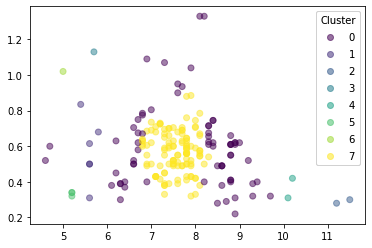

In [ ]:
fig, ax = plt.subplots()

scatter = ax.scatter(np_datas_2D[:,0], np_datas_2D[:,1], c = labels.astype(np.float),alpha = 0.5)

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster")
ax.add_artist(legend1)
plt.show()

***As expected the values of the ring around the center are considered bad. However, they are relevant for a spectral clustering. The silhouette coefficient is therefore not useful for evaluating a spectral clustering. We can see that this is a method made to evaluate a k_mean clustering***

#***5/ K-mean***

**Now lets compare clustering method to Kmeans method on the raw non clustered data. To understand hom many clusters we can expect we going to use elbow method. We run the Cluster Analysis using Cluster as 1 till 12. Also, we store the WSS Scores.**
**The WSS score will be used to create the Elbow Plot**

**WSS = Within-Cluster-Sum of Squared**

In [ ]:
K=range(1,12)
wss = []
for k in K:
    k_means2=KMeans(n_clusters=k,init="k-means++")
    k_means2=k_means2.fit(datas_reduced)
    wss_iter = k_means2.inertia_
    wss.append(wss_iter)

In [ ]:
mycenters = pd.DataFrame({'Clusters' : K, 'WSS' : wss})
mycenters

,Clusters,WSS
0,1,309315.165040
1,2,84871.750264
2,3,47313.211165
3,4,29402.710385
4,5,21781.617341
5,6,18817.785822
6,7,16551.534870
7,8,14708.629779
8,9,12971.721687
9,10,11486.829568


**Now we have WWS for each of 12 possible clusters and we can observe that value is decreasing (because compactness obviously will be large if we try to perpesent all data as a one cluter and going to be smaller with more clusters). But with this representation it is still hard to understand how many clusters we can expect from the data, so we are going to fraw the plot**

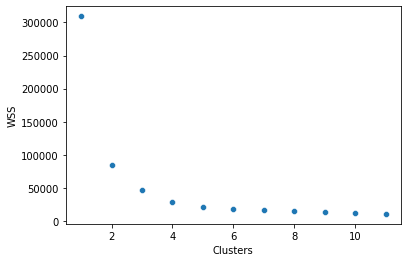

In [ ]:
sns.scatterplot(x = 'Clusters', y = 'WSS', data = mycenters)

#plt.plot(mycenters[0:11], 'b.')

**Now we can observe that after 4 cluster we have almost straight line, that means that 4 cluster can be considered as an "elbow" and taken as a result of the method**

In [ ]:
clusterNum = 4
k_means2 = KMeans(init = "k-means++", n_clusters=clusterNum)
k_means2.fit(np_datas_2D)
labels2 = k_means2.labels_
print(labels2)

[2 0 0 3 2 2 0 2 0 0 2 0 1 0 3 3 3 0 2 0 3 0 0 0 2 2 0 0 2 0 2 2 0 2 1 0 0
 0 1 2 2 3 0 0 2 1 0 3 2 1 3 2 2 3 0 0 3 0 0 2 3 0 0 2 2 2 0 2 3 0 0 0 0 0
 3 3 3 2 2 0 2 0 2 2 2 2 3 0 3 2 0 3 3 0 1 1 2 2 0 0 0 0 0 0 2 0 0 2 0 0 0
 0 0 3 0 3 0 0 3 2 2 3 2 0 0 3 0 0 0 1 0 1 1 2 0 0 0 2 0 0 0 0 1 2 1 0 1 0
 2 0 2 3 0 0 2 2 2 2 2 2 0 0 0 2 2 0 2 2 2 0 0 0 0 2 2 2 2 0 2 3 3 3 2 2 2
 3 2 0 0 0 0 2 2 0 0 0 2 3 1 2]


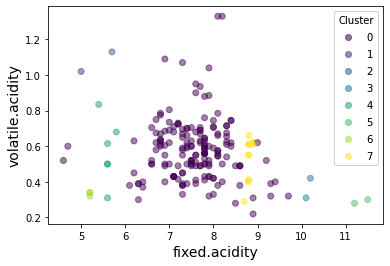

In [ ]:
fig, ax = plt.subplots()

scatter = ax.scatter(np_datas_2D[:,0], np_datas_2D[:,1], c = labels.astype(np.float), alpha = 0.5)
plt.xlabel('fixed.acidity', fontsize = 14)
plt.ylabel('volatile.acidity', fontsize = 14)

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster")
ax.add_artist(legend1)

plt.show()

**And againg we will aplly silhouette analysis to understand better the quality of K-means method clustering**

In [ ]:
score = sk.metrics.silhouette_score(datas_reduced, kmeans.labels_, metric='euclidean')
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.334


**As soon as we sturted with clustering method we could expect this low score for silhouette and bad clusterisation in general, because we already know that data expected to have circled clusters and K-means is not the solution for this case**

# Bonus With all features

This part is less commented on because it is very similar to the previous spectral clustering. It's just a test with all the features.

### ***Initialisation***

In [ ]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import random as rnd
import networkx as nx
import scipy as sy
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
 
# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from scipy.sparse.linalg import eigsh
from sklearn.neighbors import NearestNeighbors
#K-means
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
!wget -O dataset.csv https://www.openml.org/data/get_csv/49817/wine_quality.arff


--2020-11-30 12:38:30--  https://www.openml.org/data/get_csv/49817/wine_quality.arff
Resolving www.openml.org (www.openml.org)... 131.155.11.11
Connecting to www.openml.org (www.openml.org)|131.155.11.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/plain]
Saving to: ‘dataset.csv’

dataset.csv             [     <=>            ] 340.28K   335KB/s    in 1.0s    

2020-11-30 12:38:33 (335 KB/s) - ‘dataset.csv’ saved [348451]



In [ ]:
!ls -l 

total 348
-rw-r--r-- 1 root root 348451 Nov 30 12:38 dataset.csv
drwxr-xr-x 1 root root   4096 Nov 13 17:33 sample_data


In [ ]:
datas = pd.read_csv('dataset.csv')
datas.head()

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
np_datas = datas.to_numpy()
np_datas_t = np.transpose(np_datas)
#print(np_datas[1])
#print(np_datas_t)
#nb_data = 20
nb_data = 900
datas_reduced = datas[0:nb_data]

In [ ]:
def euclidian_distance(line1,line2):
  line = (line1-line2)*np.transpose((line1-line2))
  nombre = sum(line)
  return np.sqrt(nombre) ;

In [ ]:
W = np.zeros((nb_data,nb_data))
for i in range(nb_data):
  for j in range(nb_data):
    if j > i:
      W[i][j] = euclidian_distance(np_datas[i-1],np_datas[j-1])
W=W+np.transpose(W)
_mean = int(W.mean())
print(W)
print(_mean)

[[ 0.         65.01874965 31.34027183 ... 55.31327589 55.27248988
  55.31327589]
 [65.01874965  0.         35.86019221 ... 11.49166286 18.43802379
  11.49166286]
 [31.34027183 35.86019221  0.         ... 25.53581026 24.13571888
  25.53581026]
 ...
 [55.31327589 11.49166286 25.53581026 ...  0.         10.29373621
   0.        ]
 [55.27248988 18.43802379 24.13571888 ... 10.29373621  0.
  10.29373621]
 [55.31327589 11.49166286 25.53581026 ...  0.         10.29373621
   0.        ]]
39


epsilon graph

In [ ]:
sigma = 1
for i in range(nb_data):
  for j in range(nb_data):
    if W[i][j] < (_mean/10):
      n = W[i][j]
      W[i][j] = np.exp(-n**2/(2*sigma))
        #print(W[i][j])
    else : 
      W[i][j] = 0 
print(W)

[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 1. 0. 1.]]


EdgeDataView([(0, 0, {'weight': 1.0}), (1, 1, {'weight': 1.0}), (1, 5, {'weight': 1.0}), (1, 23, {'weight': 0.0047339244833152164}), (1, 28, {'weight': 0.0047339244833152164}), (1, 29, {'weight': 0.0064356130140023615}), (1, 48, {'weight': 0.0021357553413733667}), (1, 63, {'weight': 0.04739251377456361}), (1, 88, {'weight': 0.0013183837558419498}), (1, 94, {'weight': 0.0013183837558419498}), (1, 100, {'weight': 0.03419346688212428}), (1, 103, {'weight': 0.03419346688212428}), (1, 124, {'weight': 0.6485877189459158}), (1, 230, {'weight': 0.0012302806667848266}), (1, 234, {'weight': 0.0012302806667848266}), (1, 263, {'weight': 0.24385777786026505}), (1, 300, {'weight': 0.005555547998006311}), (1, 386, {'weight': 0.0055265142043018625}), (1, 623, {'weight': 0.0005593931178540101}), (1, 676, {'weight': 0.0006598670517350423}), (1, 678, {'weight': 0.0026180330040104513}), (1, 709, {'weight': 0.02435675342154423}), (1, 710, {'weight': 0.00226450717840393}), (1, 713, {'weight': 0.014885272465

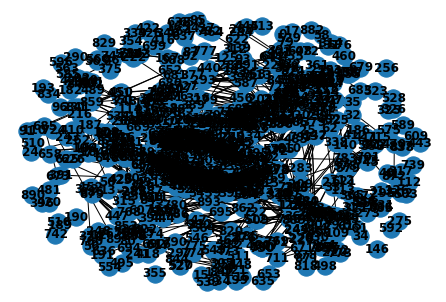

In [ ]:
G = nx.from_numpy_matrix(W)
nx.draw(G,with_labels=True,
        font_weight='bold',
       )
G.edges(data=True)

### ***Laplacian***

In [ ]:
D = np.diag(np.sum(W,axis=1))
L = L = D-W

In [ ]:
l, V = np.linalg.eig(L)
ind = np.argsort(l)
l = l[ind]
V = V[:,ind]
#print(l.reshape(-1,1)[0:20])

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


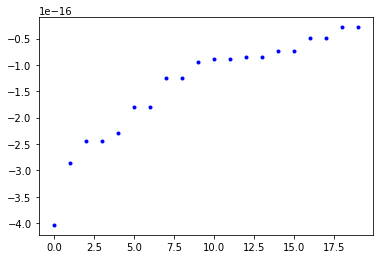

In [ ]:
plt.plot(l[:20],'b.')

In [ ]:
nb_cluster1 = np.argmax(np.diff(l[0:5]))+1
print(nb_cluster1)

1


In [ ]:
#plt.scatter(V[:,0],V[:,6])
#plt.scatter(V[:,0],V[:,2])
#print(l)
#print(V[:,0])

### ***Normalized Laplacian 1.1***

In [ ]:
#import sys
Ls = np.dot(np.dot(np.sqrt(np.linalg.inv(D)),L),np.sqrt(np.linalg.inv(D)))
np.set_printoptions(threshold=1000)
Ls

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.68730807,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.23976489, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.50646964,
         0.        , -0.49353036],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.64743836,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.49353036,
         0.        ,  0.50646964]])

In [ ]:
ls, Vs = np.linalg.eig(Ls)
ind = np.argsort(ls)
ls = ls[ind]
Vs = Vs[:,ind]
#print(Vs.reshape(-1,1)[0:20])

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


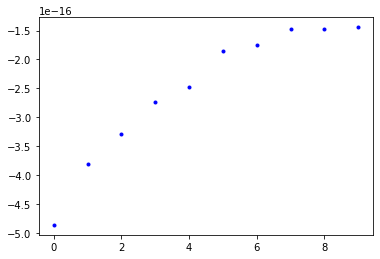

In [ ]:
plt.plot(ls[:10],'b.')

In [ ]:
nb_cluster2 = 5
print(nb_cluster2)

5


5


/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


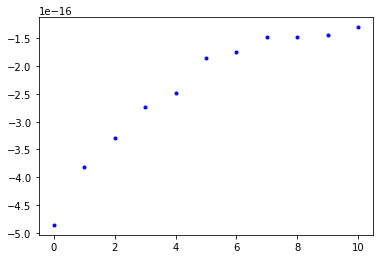

In [ ]:
ls_normalized = ls/ls[4]
plt.plot(ls[:11],'b.')
#nb_cluster2 = np.argmax(np.diff(ls[0:9]))+1
print(nb_cluster2)

In [ ]:
#according to this graph k = 8 seems to be a good number of clusters. Vk is the matrix composed with the k first eigvector of Ls
Vk = Vs[:,0:nb_cluster2]
#print(Vk)

### ***Normalized Laplacian with NX***

In [ ]:
Ls_nx = nx.normalized_laplacian_matrix(G)
print(Ls_nx[(1,2)])
for i in range(len(Ls)):
  for j in range(len(Ls)):
    Ls[i][j] = Ls_nx[(i,j)]
    Ls[j][i] = Ls_nx[(j,i)]
# Ls

0.0


In [ ]:
G2 = nx.Graph(Ls_nx)
Ls3 = nx.to_numpy_array(G2)
Ls3

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.68730807,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.23976489, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.50646964,
         0.        , -0.49353036],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.64743836,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.49353036,
         0.        ,  0.50646964]])

### ***K_mean on our matrix Vk***

In [ ]:
#print(datas[0:50])

In [ ]:
kmeans = KMeans(init = "k-means++",n_clusters=nb_cluster2)
knn_clusters = kmeans.fit_predict(np.real(Vk))

In [ ]:
labels = kmeans.labels_
#print(labels)

In [ ]:
datas_reduced["k_means"] = labels
datas_reduced.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality,k_means
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,3
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,3
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,3
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,3


In [ ]:
a = datas_reduced.groupby("k_means").mean()
print(a)

         fixed.acidity  volatile.acidity  ...    alcohol   quality
k_means                                   ...                     
0             8.455357          0.540982  ...  10.133929  5.428571
1             8.741176          0.466471  ...  10.200000  5.176471
2             8.366667          0.451667  ...  11.300000  6.666667
3             8.795244          0.540341  ...  10.156707  5.564634
4             9.225000          0.407500  ...  10.475000  6.000000

[5 rows x 12 columns]


In [ ]:
np_datas_remap = datas_reduced.to_numpy()
print(np_datas_remap[1])

[ 7.8     0.88    0.      2.6     0.098  25.     67.      0.9968  3.2
  0.68    9.8     5.      3.    ]


We juste remap the matrice W to see clusters on a graph. So we set a 1 between to values wich are in the same cluster.


In [ ]:
def mapping(row1,row2):
  if row1[12]==row2[12]:
    return 1;
  else :
    return 0;

In [ ]:
W = np.zeros((nb_data,nb_data))
for i in range(nb_data):
  for j in range(nb_data):
    W[i][j] = mapping(np_datas_remap[i-1],np_datas_remap[j-1])
_mean = int(W.mean())
print(W)
print(_mean)

[[0.2 0.2 0.2 ... 0.2 0.2 0.2]
 [0.2 0.2 0.2 ... 0.2 0.2 0.2]
 [0.2 0.2 0.2 ... 0.2 0.2 0.2]
 ...
 [0.2 0.2 0.2 ... 0.2 0.2 0.2]
 [0.2 0.2 0.2 ... 0.2 0.2 0.2]
 [0.2 0.2 0.2 ... 0.2 0.2 0.2]]
0


EdgeDataView([(0, 0, {'weight': 0.2}), (0, 1, {'weight': 0.2}), (0, 2, {'weight': 0.2}), (0, 3, {'weight': 0.2}), (0, 4, {'weight': 0.2}), (0, 5, {'weight': 0.2}), (0, 6, {'weight': 0.2}), (0, 7, {'weight': 0.2}), (0, 8, {'weight': 0.2}), (0, 9, {'weight': 0.2}), (0, 10, {'weight': 0.2}), (0, 12, {'weight': 0.2}), (0, 14, {'weight': 0.2}), (0, 15, {'weight': 0.2}), (0, 16, {'weight': 0.2}), (0, 17, {'weight': 0.2}), (0, 18, {'weight': 0.2}), (0, 19, {'weight': 0.2}), (0, 20, {'weight': 0.2}), (0, 21, {'weight': 0.2}), (0, 22, {'weight': 0.2}), (0, 24, {'weight': 0.2}), (0, 25, {'weight': 0.2}), (0, 26, {'weight': 0.2}), (0, 27, {'weight': 0.2}), (0, 28, {'weight': 0.2}), (0, 29, {'weight': 0.2}), (0, 30, {'weight': 0.2}), (0, 31, {'weight': 0.2}), (0, 32, {'weight': 0.2}), (0, 33, {'weight': 0.2}), (0, 34, {'weight': 0.2}), (0, 35, {'weight': 0.2}), (0, 36, {'weight': 0.2}), (0, 37, {'weight': 0.2}), (0, 38, {'weight': 0.2}), (0, 39, {'weight': 0.2}), (0, 40, {'weight': 0.2}), (0, 43, 

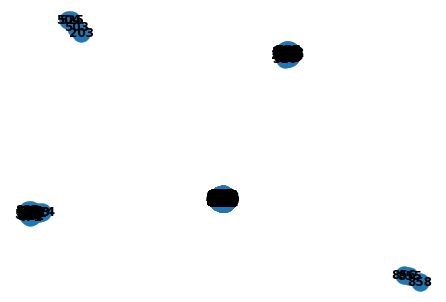

In [ ]:
G = nx.from_numpy_matrix(W)
nx.draw(G,with_labels=True,
        font_weight='bold',
        
       )
G.edges(data=True)